# Project With Face Book Data

## Import Data

In [3]:
# import necessary libraries
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import RobustScaler
from pandas import DataFrame
from pandas_profiling import ProfileReport

In [4]:
# load a DataSet to your Directory
df = pd.read_csv("pseudo_facebook.csv")

## Explorarory Data Analysis

In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99003 entries, 0 to 99002
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   userid                 99003 non-null  int64  
 1   age                    99003 non-null  int64  
 2   dob_day                99003 non-null  int64  
 3   dob_year               99003 non-null  int64  
 4   dob_month              99003 non-null  int64  
 5   gender                 99003 non-null  object 
 6   tenure                 99003 non-null  float64
 7   friend_count           99003 non-null  int64  
 8   friendships_initiated  99003 non-null  int64  
 9   likes                  99003 non-null  int64  
 10  likes_received         99003 non-null  int64  
 11  mobile_likes           99003 non-null  int64  
 12  mobile_likes_received  99003 non-null  int64  
 13  www_likes              99003 non-null  int64  
 14  www_likes_received     99003 non-null  int64  
dtypes:

In [9]:
df.describe()

,userid,age,dob_day,dob_year,dob_month,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
count,9.900300e+04,99003.000000,99003.000000,99003.000000,99003.000000,99001.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000,99003.000000
mean,1.597045e+06,37.280224,14.530408,1975.719776,6.283365,537.887375,196.350787,107.452471,156.078785,142.689363,106.116300,84.120491,49.962425,58.568831
std,3.440592e+05,22.589748,9.015606,22.589748,3.529672,457.649874,387.304229,188.786951,572.280681,1387.919613,445.252985,839.889444,285.560152,601.416348
min,1.000008e+06,13.000000,1.000000,1900.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.298806e+06,20.000000,7.000000,1963.000000,3.000000,226.000000,31.000000,17.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,1.596148e+06,28.000000,14.000000,1985.000000,6.000000,412.000000,82.000000,46.000000,11.000000,8.000000,4.000000,4.000000,0.000000,2.000000
75%,1.895744e+06,50.000000,22.000000,1993.000000,9.000000,675.000000,206.000000,117.000000,81.000000,59.000000,46.000000,33.000000,7.000000,20.000000
max,2.193542e+06,113.000000,31.000000,2000.000000,12.000000,3139.000000,4923.000000,4144.000000,25111.000000,261197.000000,25111.000000,138561.000000,14865.000000,129953.000000


In [10]:
df.shape

(99003, 15)

In [12]:
df.head(5)

,userid,age,dob_day,dob_year,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
0,2094382,14,19,1999,11,male,266.0,0,0,0,0,0,0,0,0
1,1192601,14,2,1999,11,female,6.0,0,0,0,0,0,0,0,0
2,2083884,14,16,1999,11,male,13.0,0,0,0,0,0,0,0,0
3,1203168,14,25,1999,12,female,93.0,0,0,0,0,0,0,0,0
4,1733186,14,4,1999,12,male,82.0,0,0,0,0,0,0,0,0


In [14]:
df.sample(5)

,userid,age,dob_day,dob_year,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
14098,1923643,51,22,1962,12,male,317.0,15,11,15,11,3,8,12,3
89932,2041461,22,9,1991,7,female,1102.0,456,278,562,357,0,68,562,289
33728,1718370,64,8,1949,9,male,587.0,46,31,1,0,1,0,0,0
70093,1660715,102,12,1911,4,female,815.0,171,136,574,254,14,63,560,191
53098,1681621,18,20,1995,7,male,149.0,93,78,386,33,386,26,0,7


<h2>Our Data have no duplicates<h2>

In [18]:
# Check if there any duplicated Variables in our `df`
duplicated_data = df.duplicated().sum()
print(f"There are {duplicated_data.sum()} duplicate rows in the dataset.")

There are 0 duplicate rows in the dataset.


In [19]:
features = df.columns
features

Index(['userid', 'age', 'dob_day', 'dob_year', 'dob_month', 'gender', 'tenure',
       'friend_count', 'friendships_initiated', 'likes', 'likes_received',
       'mobile_likes', 'mobile_likes_received', 'www_likes',
       'www_likes_received'],
      dtype='object')

array([[<AxesSubplot:title={'center':'userid'}>,
        <AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'dob_day'}>,
        <AxesSubplot:title={'center':'dob_year'}>],
       [<AxesSubplot:title={'center':'dob_month'}>,
        <AxesSubplot:title={'center':'tenure'}>,
        <AxesSubplot:title={'center':'friend_count'}>,
        <AxesSubplot:title={'center':'friendships_initiated'}>],
       [<AxesSubplot:title={'center':'likes'}>,
        <AxesSubplot:title={'center':'likes_received'}>,
        <AxesSubplot:title={'center':'mobile_likes'}>,
        <AxesSubplot:title={'center':'mobile_likes_received'}>],
       [<AxesSubplot:title={'center':'www_likes'}>,
        <AxesSubplot:title={'center':'www_likes_received'}>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

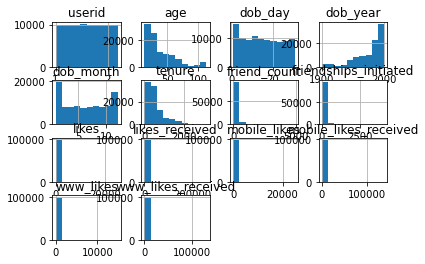

In [20]:
df.hist()

In [24]:
# Creat a var that provide to us that columns that have a Numerical Data ==> Num_features
# Creat a var that provide to us that columns that have a categorical Data ==> Cat_features
Num_features = [feature for feature in features if df[feature].dtype != object]
Cat_features = [feature for feature in features if df[feature].dtype == object]

In [25]:
Num_features

['userid',
 'age',
 'dob_day',
 'dob_year',
 'dob_month',
 'tenure',
 'friend_count',
 'friendships_initiated',
 'likes',
 'likes_received',
 'mobile_likes',
 'mobile_likes_received',
 'www_likes',
 'www_likes_received']

In [26]:
Cat_features

['gender']

In [27]:
# fill missing values in a DataFrame with the next non-missing value in the same column, also known as backfilling.
df  = df.fillna(method="bfill")

In [6]:
# get a full report for our DataSet
report = pandas_profiling.ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Initial plan for data exploration
In data exploration, we'll plot histograms, boxplots , correaltion matrix,subplot of all numerical features and see countplot of the categorical variables

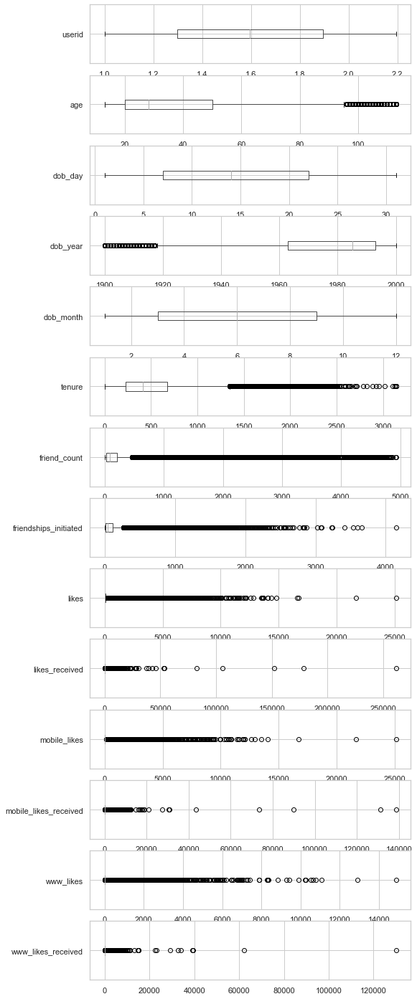

In [31]:
# this code can be useful for visualizing the distribution of numerical features in a dataset and identifying potential outliers or anomalies. However, it's important to carefully consider the context and the nature of the data before drawing conclusions from the boxplots.
# Create a 14x1 grid of subplots
fig, axes = plt.subplots(14,1 ,figsize=(8,25))

# Loop over each column in Num_features
for i,c in enumerate(Num_features):
    # Create a boxplot for the current column and add it to the corresponding subplot
    f = df[[c]].boxplot(ax=axes[i], vert=False)

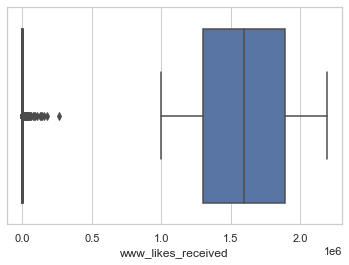

In [32]:
# Set the plot style to whitegrid
sns.set_theme(style="whitegrid")
# Loop over each column in Num_features
for i, c in enumerate(Num_features):
    # Create a boxplot for the current column and display it
    ax = sns.boxplot(x = df[c])

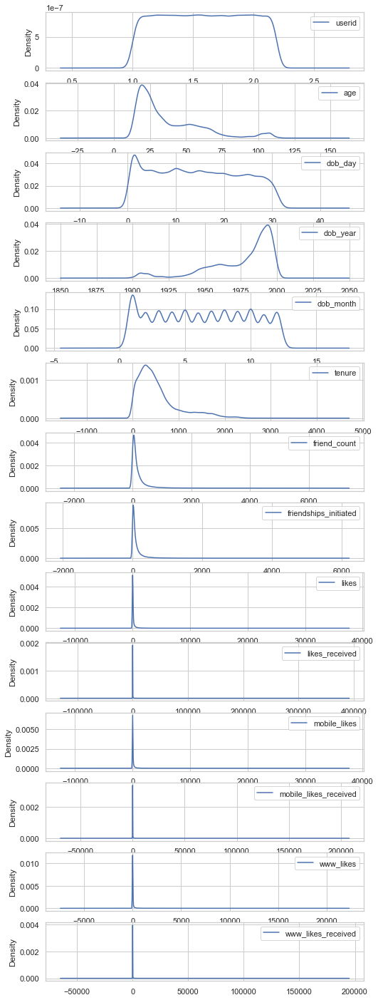

In [33]:
# Create a 14x1 grid of subplots
fig, axes = plt.subplots(14, 1, figsize=(8, 25))

# Loop over each column in Num_features
for i, c in enumerate(Num_features):
    # Create a KDE plot for the current column and add it to the corresponding subplot
    f = df[[c]].plot(kind='kde', ax=axes[i])

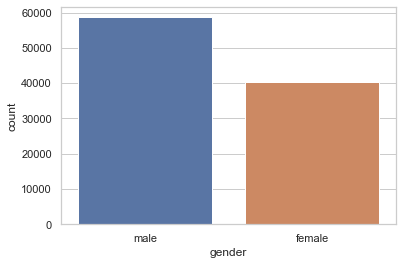

In [35]:
# For categorical features
countplot = sns.countplot(x="gender",data=df)

In [51]:
# get the average of our DataFrame `mean`for Numerical Data
df_mean = df[Num_features].mean()
df_mean

userid                   1.597045e+06
age                      3.728022e+01
dob_day                  1.453041e+01
dob_year                 1.975720e+03
dob_month                6.283365e+00
tenure                   5.378966e+02
friend_count             1.963508e+02
friendships_initiated    1.074525e+02
likes                    1.560788e+02
likes_received           1.426894e+02
mobile_likes             1.061163e+02
mobile_likes_received    8.412049e+01
www_likes                4.996243e+01
www_likes_received       5.856883e+01
dtype: float64

In [52]:
# mean for Categorical Data
df_n = df.groupby('gender').mean()
df_n.sum()

userid                   3.194282e+06
age                      7.526104e+01
dob_day                  2.921762e+01
dob_year                 3.950739e+03
dob_month                1.261395e+01
tenure                   1.091937e+03
friend_count             4.069644e+02
friendships_initiated    2.169225e+02
likes                    3.446566e+02
likes_received           3.193983e+02
mobile_likes             2.331085e+02
mobile_likes_received    1.879424e+02
www_likes                1.115480e+02
www_likes_received       1.314558e+02
dtype: float64

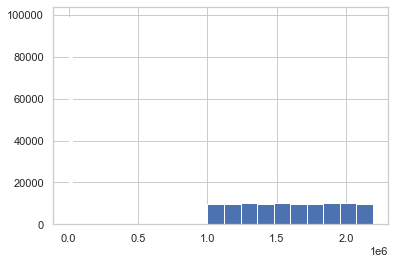

In [53]:
for r in Num_features:
    df[r].hist()

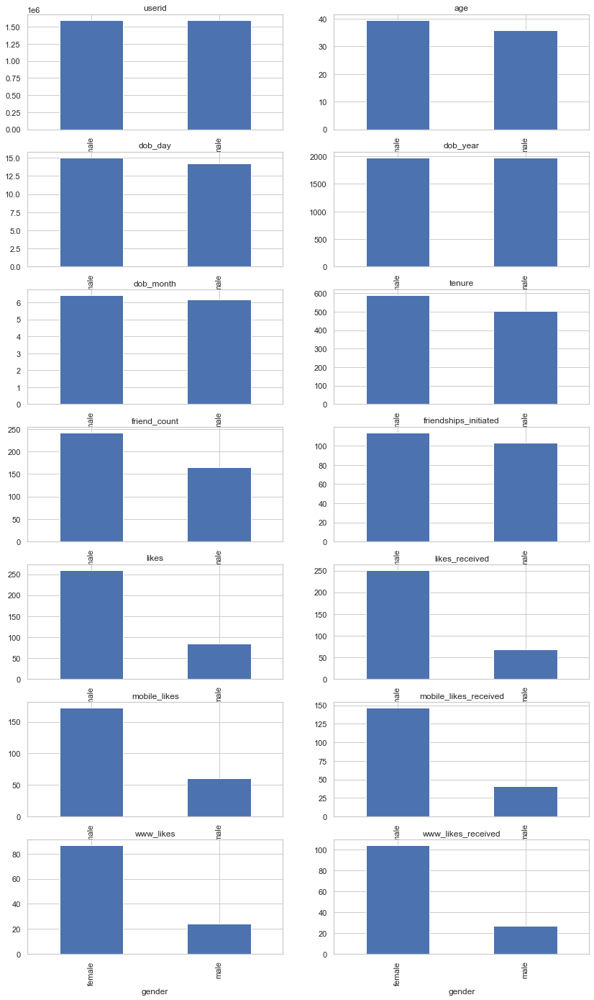

In [55]:
# Create a 7x2 grid of subplots
fix, axes = plt.subplots(7, 2, figsize=(14, 24))
axes = [ax for axes_row in axes for ax in axes_row]

# Loop over each column in Num_features
for i, c in enumerate(df[Num_features]):
    # Group the DataFrame by gender and calculate the mean of the current column
    df_n = df.groupby('gender')[c].mean()
    # Create a bar plot of the mean values for the current column, grouped by gender
    plot = df_n.plot(kind='bar', title=c, ax=axes[i])

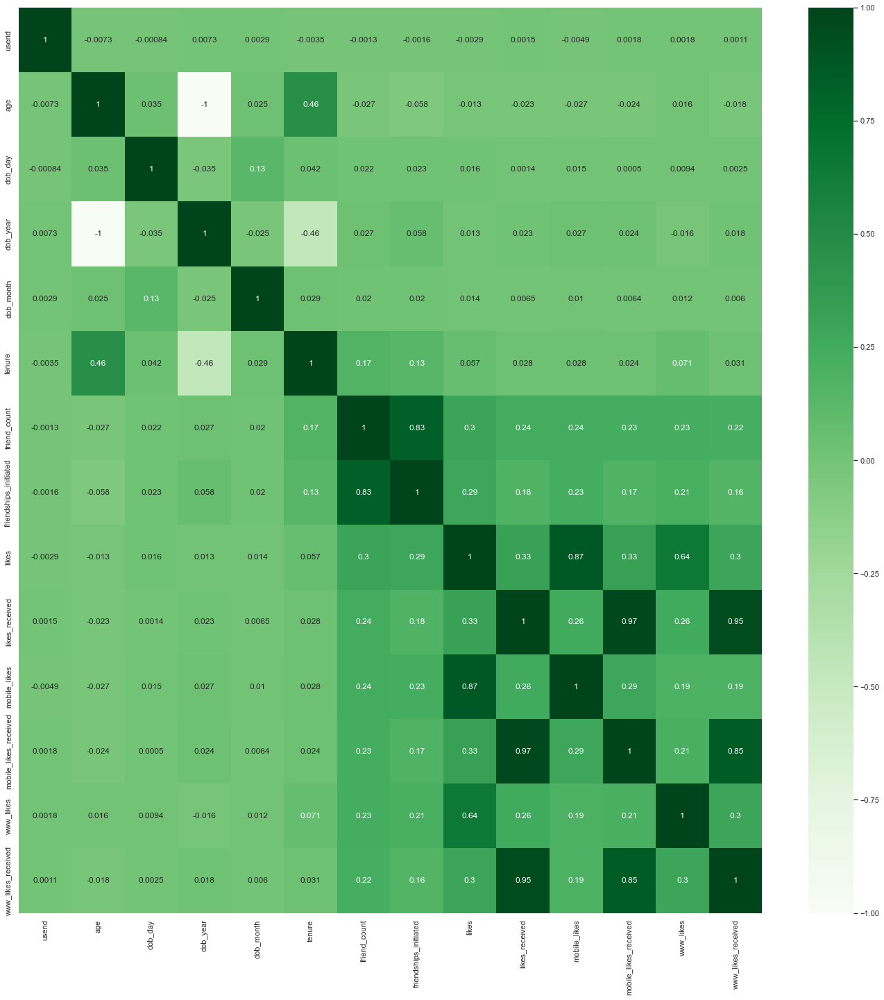

In [56]:
# Calculate the Pearson correlation matrix for the numerical features in the DataFrame
corr_matrix = df[Num_features].corr(method='pearson')

# Create a figure with a size of 24x24 inches
plt.figure(figsize=(24, 24))

# Create a heatmap of the correlation matrix using Seaborn
correc = sns.heatmap(corr_matrix, annot=True, cmap='Greens')

In [57]:
# Map the gender column from string values to integer values
df['gender'] = df.gender.map({"male": 0, "female": 1})

print(df)

        userid  age  ...  www_likes  www_likes_received
0      2094382   14  ...          0                   0
1      1192601   14  ...          0                   0
2      2083884   14  ...          0                   0
3      1203168   14  ...          0                   0
4      1733186   14  ...          0                   0
...        ...  ...  ...        ...                 ...
98998  1268299   68  ...        491                6202
98999  1256153   18  ...          2                2820
99000  1195943   15  ...          0                1092
99001  1468023   23  ...          0                 756
99002  1397896   39  ...          0                2913

[99003 rows x 15 columns]


In [58]:
# Create a new column with the mapped gender values
df['gender_num'] = df.gender.map({"male": 0, "female": 1})

print(df)

        userid  age  dob_day  ...  www_likes  www_likes_received  gender_num
0      2094382   14       19  ...          0                   0         NaN
1      1192601   14        2  ...          0                   0         NaN
2      2083884   14       16  ...          0                   0         NaN
3      1203168   14       25  ...          0                   0         NaN
4      1733186   14        4  ...          0                   0         NaN
...        ...  ...      ...  ...        ...                 ...         ...
98998  1268299   68        4  ...        491                6202         NaN
98999  1256153   18       12  ...          2                2820         NaN
99000  1195943   15       10  ...          0                1092         NaN
99001  1468023   23       11  ...          0                 756         NaN
99002  1397896   39       15  ...          0                2913         NaN

[99003 rows x 16 columns]


In [60]:
df_correlation = df.corr()

In [61]:
# Compute the correlation matrix using the Spearman method and handle missing values
det = df.corr(method='spearman').dropna(how='all').dropna(axis=1, how='all')

In [62]:
det['gender'].sort_values(ascending = False)

gender                   1.000000
likes_received           0.304739
likes                    0.298426
www_likes_received       0.297778
mobile_likes_received    0.292744
mobile_likes             0.240574
www_likes                0.188335
friend_count             0.104972
age                      0.081424
tenure                   0.081097
friendships_initiated    0.055243
dob_day                  0.047429
dob_month                0.036071
userid                   0.001483
dob_year                -0.081424
Name: gender, dtype: float64

# Actions taken for data cleaning and feature engineering
1. All null values were found and replaced by the before fill method (as the percentage of null was less than 0.5%)
2. Numerical and categorical variables were seperated
3. After plotting correlation matrix, we dropped least significant features(with relation to the feature 'gender')
4. Robust scalar was used to scale every feature{ also removing outliers}

# Key Findings and Insights, which synthesizes the results of Exploratory Data Analysis in an insightful and actionable manner
1. Correlation and significance of all features were found out
2. distribution of values in all features were seen
3. Relationship between all features mean and our targer feature was seen

In [63]:
# Drop the 'dob_day', 'dob_month', and 'friendships_initiated' columns from the DataFrame
df_final = df.drop(['dob_day', 'dob_month', 'friendships_initiated'], axis=1)

# Drop the 'userid' column from the DataFrame
df_final = df_final.drop('userid', axis=1)

# Print the modified DataFrame
print(df_final)

       age  dob_year  gender  ...  www_likes  www_likes_received  gender_num
0       14      1999       0  ...          0                   0         NaN
1       14      1999       1  ...          0                   0         NaN
2       14      1999       0  ...          0                   0         NaN
3       14      1999       1  ...          0                   0         NaN
4       14      1999       0  ...          0                   0         NaN
...    ...       ...     ...  ...        ...                 ...         ...
98998   68      1945       1  ...        491                6202         NaN
98999   18      1995       1  ...          2                2820         NaN
99000   15      1998       1  ...          0                1092         NaN
99001   23      1990       1  ...          0                 756         NaN
99002   39      1974       1  ...          0                2913         NaN

[99003 rows x 12 columns]


In [64]:
# Create a copy of the DataFrame without the specified columns
df_final = df.drop(['dob_day', 'dob_month', 'friendships_initiated', 'userid'], axis=1).copy()

# Print the modified DataFrame
print(df_final)

       age  dob_year  gender  ...  www_likes  www_likes_received  gender_num
0       14      1999       0  ...          0                   0         NaN
1       14      1999       1  ...          0                   0         NaN
2       14      1999       0  ...          0                   0         NaN
3       14      1999       1  ...          0                   0         NaN
4       14      1999       0  ...          0                   0         NaN
...    ...       ...     ...  ...        ...                 ...         ...
98998   68      1945       1  ...        491                6202         NaN
98999   18      1995       1  ...          2                2820         NaN
99000   15      1998       1  ...          0                1092         NaN
99001   23      1990       1  ...          0                 756         NaN
99002   39      1974       1  ...          0                2913         NaN

[99003 rows x 12 columns]


array([[<AxesSubplot:title={'center':'age'}>,
        <AxesSubplot:title={'center':'dob_year'}>,
        <AxesSubplot:title={'center':'gender'}>],
       [<AxesSubplot:title={'center':'tenure'}>,
        <AxesSubplot:title={'center':'friend_count'}>,
        <AxesSubplot:title={'center':'likes'}>],
       [<AxesSubplot:title={'center':'likes_received'}>,
        <AxesSubplot:title={'center':'mobile_likes'}>,
        <AxesSubplot:title={'center':'mobile_likes_received'}>],
       [<AxesSubplot:title={'center':'www_likes'}>,
        <AxesSubplot:title={'center':'www_likes_received'}>,
        <AxesSubplot:title={'center':'gender_num'}>]], dtype=object)

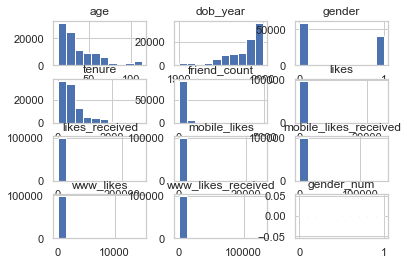

In [65]:
df_final.hist()

In [66]:
# Initialize the RobustScaler transformation
transformation = RobustScaler()

In [67]:
# Apply the transformation to the DataFrame and get the transformed data in a NumPy array
X = transformation.fit_transform(df_final)

C:\Users\AT\anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:993: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanmedian1d, axis, a, overwrite_input)
C:\Users\AT\anaconda3\lib\site-packages\numpy\lib\nanfunctions.py:1368: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(


In [68]:
# Convert the NumPy array to a DataFrame
dataset = DataFrame(X)

In [69]:
# Print the summary statistics of the transformed data
print(dataset.describe())

                 0             1   ...            10   11
count  99003.000000  99003.000000  ...  99003.000000  0.0
mean       0.309341     -0.309341  ...      2.828442  NaN
std        0.752992      0.752992  ...     30.070817  NaN
min       -0.500000     -2.833333  ...     -0.100000  NaN
25%       -0.266667     -0.733333  ...     -0.100000  NaN
50%        0.000000      0.000000  ...      0.000000  NaN
75%        0.733333      0.266667  ...      0.900000  NaN
max        2.833333      0.500000  ...   6497.550000  NaN

[8 rows x 12 columns]


array([[<AxesSubplot:title={'center':'0'}>,
        <AxesSubplot:title={'center':'1'}>,
        <AxesSubplot:title={'center':'2'}>],
       [<AxesSubplot:title={'center':'3'}>,
        <AxesSubplot:title={'center':'4'}>,
        <AxesSubplot:title={'center':'5'}>],
       [<AxesSubplot:title={'center':'6'}>,
        <AxesSubplot:title={'center':'7'}>,
        <AxesSubplot:title={'center':'8'}>],
       [<AxesSubplot:title={'center':'9'}>,
        <AxesSubplot:title={'center':'10'}>,
        <AxesSubplot:title={'center':'11'}>]], dtype=object)

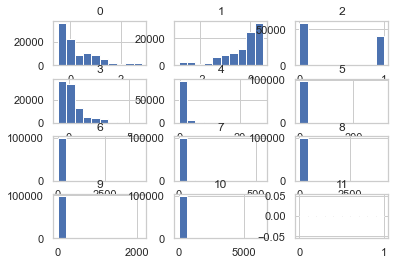

In [70]:
# Create a histogram of the transformed data
dataset.hist()

# Findings
1. likes, mobile_likes,, www_likes, friend_count, tenure. age, likes_recieved, www_likes_recieved, mobile_likes recieved are positively related to the target feature(Gender)
2. dob_year is negatively related to gender
3. The rest features do not have any significant relationship/correlation with gender, thus can be dropped

=> Chosen features for next ML/DL algorithm are likes, mobile_likes,, www_likes, friend_count, tenure. age, likes_recieved, www_likes_recieved, mobile_likes recieved, dob_year

=> We haven't been asked to apply ML/DL algos in this question, so we'll jump to the Hypothesis part directly

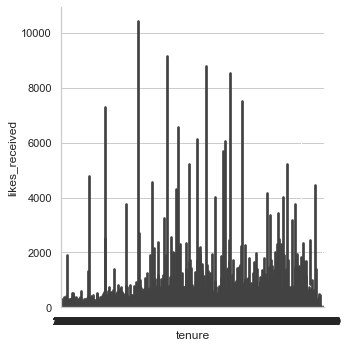

In [72]:
# Create a bar plot using the 'catplot()' function
sns.catplot(x='tenure', y='likes_received', kind="bar", data=df)

## Conducting a formal significance test for one of the hypotheses and discuss the results
## Hypothesis 2 was null hypothesis as we call nullify it with the results obtained from above plot

=> The likes do no necessarily increase with increase in tenure.

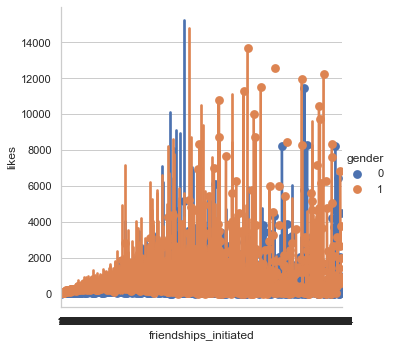

In [73]:
# Create a point plot using the 'catplot()' function
sns.catplot(x="friendships_initiated", y="likes", hue="gender", kind="point", data=df)